In [1]:
from matplotlib import pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import matplotlib.lines as mlines
import matplotlib.patches as mpatches
from matplotlib.ticker import MultipleLocator
from pylab import *
import seaborn as sns
from matplotlib import rc
import matplotlib
import pandas as pd
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.set_style('ticks')
import matplotlib.font_manager
for font in matplotlib.font_manager.findSystemFonts(
    '/Users/deepak/Library/Fonts/'):
    matplotlib.font_manager.fontManager.addfont(font)
font = {
    #'font.family':'Roboto',
    'font.weight': 1000,
    'font.size': 12,
}
sns.set_style(font)
paper_rc = {
    'lines.linewidth': 3,
    'lines.markersize': 10,
}
sns.set_context("paper", font_scale=3,  rc=paper_rc)
current_palette = sns.color_palette()

In [2]:
def read_logfile(logfile_name):
    all_values = []
    value_labels = ['num_attention_heads', 'hidden_size', 'train_micro_batch_size_per_gpu',
                    'tensor_mp_size', 'pipeline_mp_size', 'dp_size',]
    with open(logfile_name, 'r') as f:
        reading_estimate = False
        for line in f:
            line = line.strip()
            if line == "Estimate":
                reading_estimate = True
            elif line == "Actual":
                reading_estimate = False
            match = re.match(r'num_attention_heads: (\d+), hidden_size: (\d+), '
                             r'train_micro_batch_size_per_gpu: (\d+), tensor_mp_size: (\d+), '
                             r'pipeline_mp_size: (\d+), dp_size: (\d+)', line)
            if match is not None:
                values = {}
                for i in range(1, 7):
                    values[value_labels[i-1]] = int(match.group(i))
                all_values.append(values)

            match = re.match(r'num_attention_heads: (\d+), hidden_size: (\d+), '
                             r'microbatch_size: (\d+), tensor_mp_size: (\d+), '
                             r'pipeline_mp_size: (\d+), dp_size: (\d+)', line)
                             
            if match is not None:
                values = {}
                for i in range(1, 7):
                    values[value_labels[i-1]] = int(match.group(i))
                all_values.append(values)

            match = re.match(r'Throughput \(in TFLOP/s\) for attention_key_value_query_transform \((.*)\): (\d+\.\d+)', line)
            if match is not None:
                throughput = float(match.group(2))
                if reading_estimate:
                    all_values[-1]["attention_key_value_query_transform"] = throughput
            
            match = re.match(r'Throughput \(in TFLOP/s\) for attention_key_query_prob \((.*)\): (\d+\.\d+)', line)
            if match is not None:
                throughput = float(match.group(2))
                if reading_estimate:
                    all_values[-1]["attention_key_query_prob"] = throughput

            match = re.match(r'Throughput \(in TFLOP/s\) for attention_prob_times_values \((.*)\): (\d+\.\d+)', line)
            if match is not None:
                throughput = float(match.group(2))
                if reading_estimate:
                    all_values[-1]["attention_prob_times_values"] = throughput
            
            match = re.match(r'Throughput \(in TFLOP/s\) for attention_linear_projection \((.*)\): (\d+\.\d+)', line)
            if match is not None:
                throughput = float(match.group(2))
                if reading_estimate:
                    all_values[-1]["attention_linear_projection"] = throughput 

            match = re.match(r'Throughput \(in TFLOP/s\) for mlp_h_to_4h \((.*)\): (\d+\.\d+)', line)
            if match is not None:
                throughput = float(match.group(2))
                if reading_estimate:
                    all_values[-1]["mlp_h_to_4h"] = throughput  

            match = re.match(r'Throughput \(in TFLOP/s\) for mlp_4h_to_h \((.*)\): (\d+\.\d+)', line)
            if match is not None:
                throughput = float(match.group(2))
                if reading_estimate:
                    all_values[-1]["mlp_4h_to_h"] = throughput 
                
            match = re.match(r'Attention throughput \(in TFLOP/s\): (\d+\.\d+)', line)
            if match is not None:
                throughput = float(match.group(1))
                if reading_estimate:
                    all_values[-1]["estimated_attention_throughput"] = throughput
                else:
                   all_values[-1]["actual_attention_throughput"] = throughput 

            match = re.match(r'Transformer duration \(in seconds\): (\d+\.\d+)', line)
            if match is not None:
                duration = float(match.group(1))
                if reading_estimate:
                    all_values[-1]["estimated_duration"] = duration
                else:
                    all_values[-1]["actual_duration"] = duration
            match = re.match(r'Transformer throughput \(in TFLOP/s\): (\d+\.\d+)', line)
            if match is not None:
                throughput = float(match.group(1))
                if reading_estimate:
                    all_values[-1]["estimated_throughput"] = throughput
                else:
                    all_values[-1]["actual_throughput"] = throughput
    return all_values


def is_in_group(durations, group):
    match = True
    for group_key in group:
        if durations[group_key] != group[group_key]:
            match = False
    return match

def make_dataframe(all_values,plot_value):
    num_heads = [{'num_attention_heads': 8},{'num_attention_heads': 12},{'num_attention_heads': 16},{'num_attention_heads': 20},{'num_attention_heads': 24},{'num_attention_heads': 32},{'num_attention_heads': 40},{'num_attention_heads': 64},{'num_attention_heads': 80},
                 {'num_attention_heads': 96},{'num_attention_heads': 128},{'num_attention_heads': 256},{'num_attention_heads': 512}]
    x_and_y_values=[]
    for i in range(len(num_heads)):
        xy = [[num_heads[i]["num_attention_heads"],values['hidden_size'],
                           values[plot_value]]
                          for values in all_values 
                          if is_in_group(values, num_heads[i]) 
                          #and values['hidden_size'] <= max_size 
                          #and values['hidden_size'] >= min_size 
                          #and (values['hidden_size']/num_heads[i]["num_attention_heads"]) %64==0
        ]
        for each in xy:
            x_and_y_values.append(each)
    frame_array=np.array(x_and_y_values)

    return pd.DataFrame(data=frame_array,columns=["a","h","tflops"])



In [3]:
def plot_hidden_sweep(all_values,plot_value):
    df = make_dataframe(all_values,plot_value)
    print(df)
    sns.heatmap(data=df.pivot(index='a',columns='h',values='tflops'))

    plt.xlabel('h')
    plt.ylabel('a')
    plt.title('Heatmap of tflops')

    plt.show()

           a        h  tflops
0        8.0      8.0   0.612
1        8.0     16.0   1.178
2        8.0     24.0   1.857
3        8.0     32.0   2.290
4        8.0     40.0   2.980
...      ...      ...     ...
15428  512.0  30720.0  21.252
15429  512.0  31232.0  30.193
15430  512.0  31744.0  22.939
15431  512.0  32256.0  30.272
15432  512.0  32768.0  59.449

[15433 rows x 3 columns]


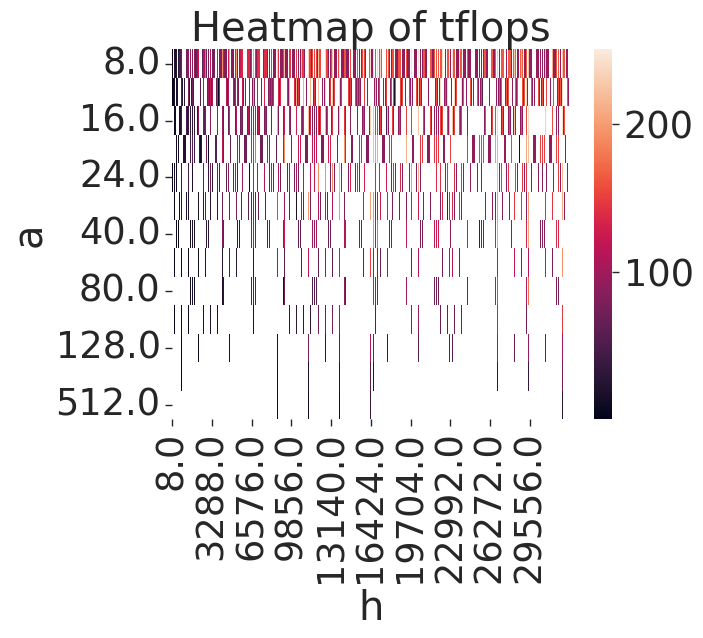

In [4]:
plot_hidden_sweep(read_logfile("results/3d_plot.out"),"attention_key_query_prob")

In [5]:
def plot_hidden_sweep(all_values,plot_value, title, point_plot=None, tp = None, output_filename=None):
    ylabel="Throughput \n (TFLOP/s)"
    num_heads = [{'num_attention_heads': 8},{'num_attention_heads': 12},{'num_attention_heads': 16},{'num_attention_heads': 20},{'num_attention_heads': 24},{'num_attention_heads': 32},{'num_attention_heads': 40},{'num_attention_heads': 64},{'num_attention_heads': 80},
                 {'num_attention_heads': 96},{'num_attention_heads': 128},{'num_attention_heads': 256},{'num_attention_heads': 512}]
    tps = [{'tensor_mp_size':tp}]
    min_size = 9472-128 #10240-128
    max_size = 12032 #32768+128
    plt.figure(figsize=(12,10),dpi=500)
    ax=plt.subplot2grid((1,1),(0,0),colspan=1)
    for i in range(len(num_heads)):
        x_and_y_values = [(values['hidden_size'],
                           values[plot_value])
                          for values in all_values 
                          if is_in_group(values, num_heads[i]) 
                          #and values['hidden_size'] <= max_size 
                          #and values['hidden_size'] >= min_size 
                          and (values['hidden_size']/num_heads[i]["num_attention_heads"]) %64==0
        ]
        ax.plot([x for (x, _) in x_and_y_values],
                [y for (_, y) in x_and_y_values],
                marker='o',
                label=f"n: {num_heads[i].get('num_attention_heads')}")
        if point_plot:
            ax.plot(point_plot,[values[plot_value] 
                       for values in all_values 
                       if is_in_group(values, num_heads[i]) 
                       and values['hidden_size'] in point_plot], 
                       color='black',marker='o')
    plt.legend(frameon=False, ncol=2, loc="upper left")
    ax.set_xlabel("Hidden Size")
    ax.set_ylabel(ylabel)
    #ax.set_title(title)
    sns.despine()
    #ax.xaxis.set_ticks(np.linspace(min_size,max_size,5))
    if output_filename is not None:
        plt.savefig(output_filename, bbox_inches='tight')

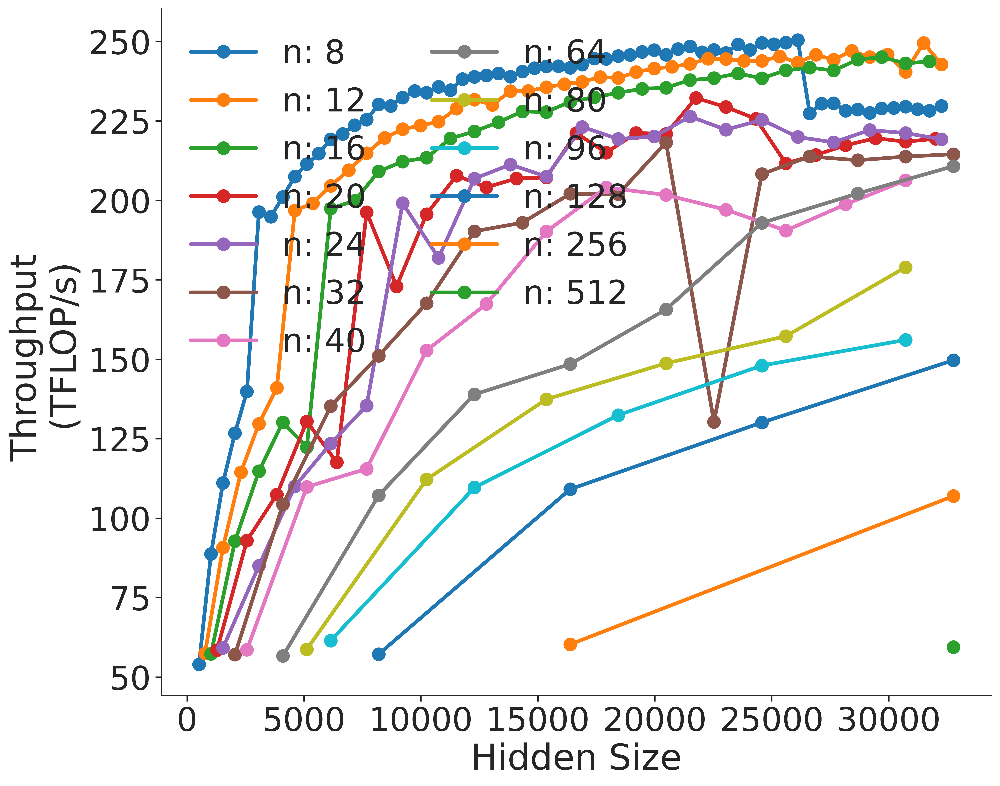

In [6]:
plot_hidden_sweep(read_logfile("results/3d_plot.out"),"attention_key_query_prob","title")

/tmp/ipykernel_2127550/3066578877.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


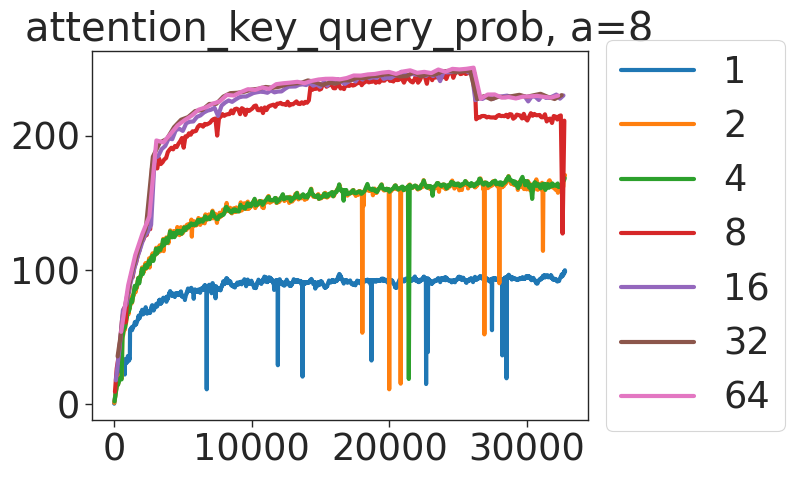

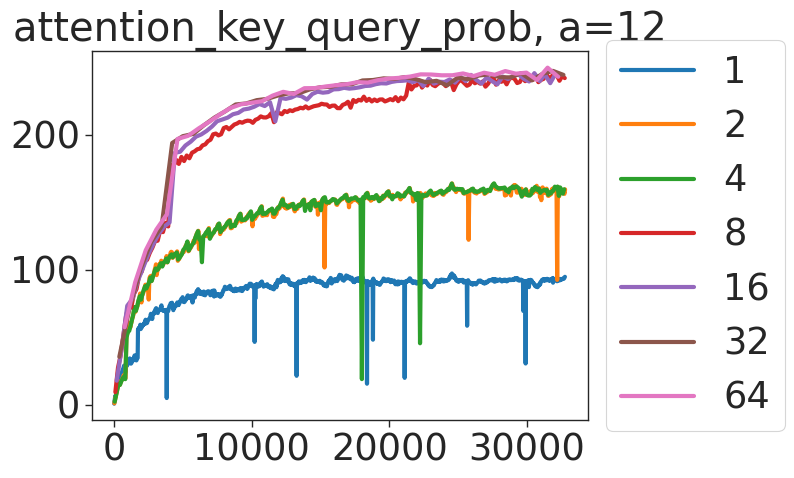

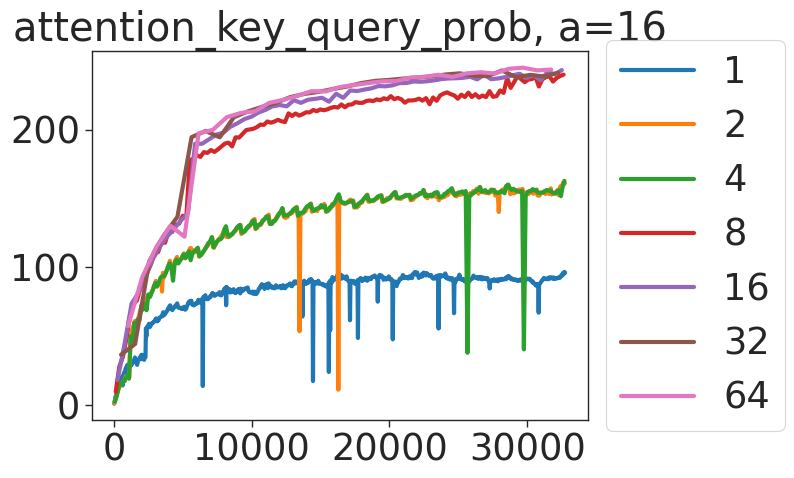

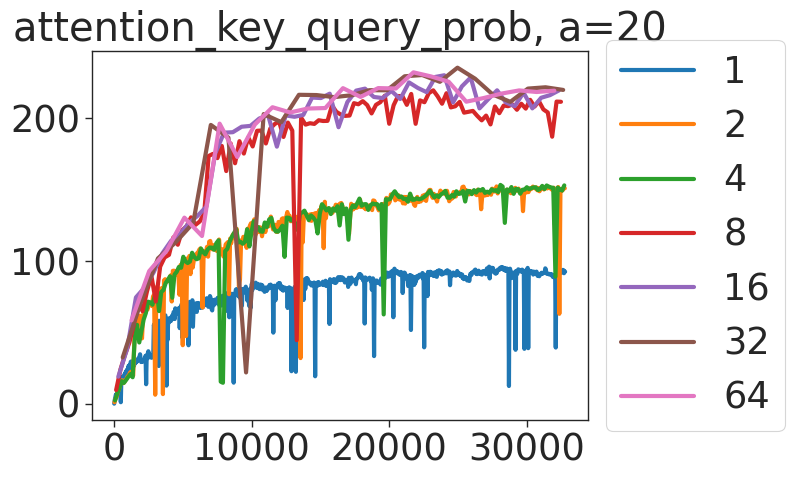

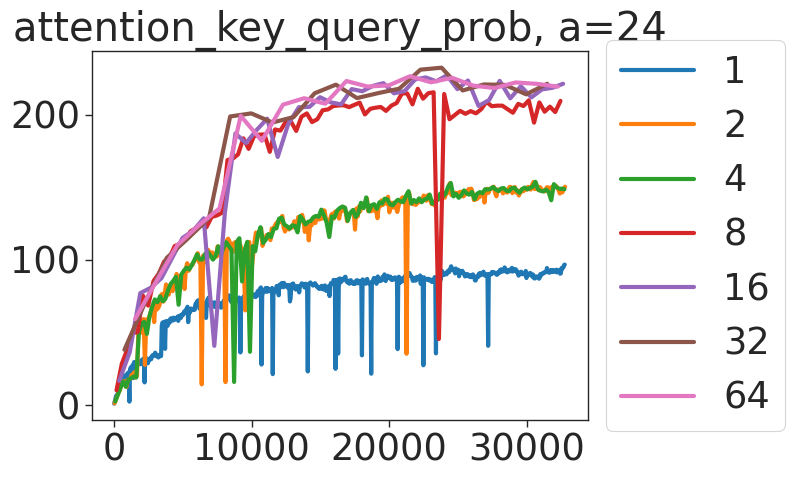

...

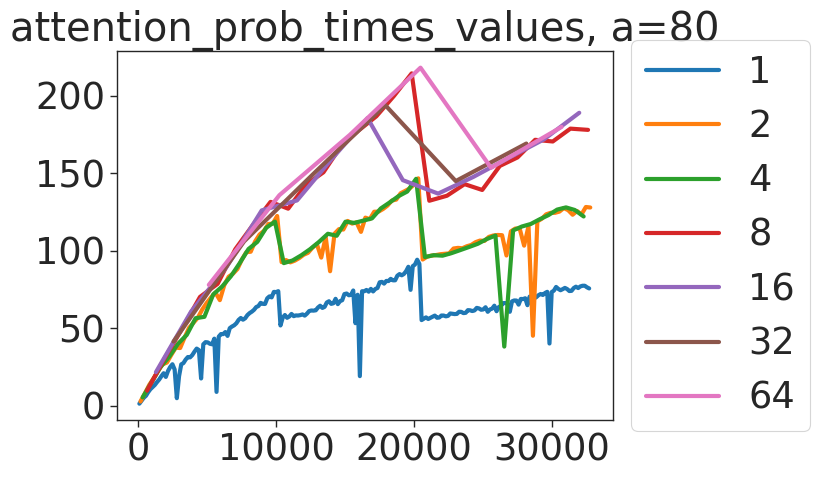

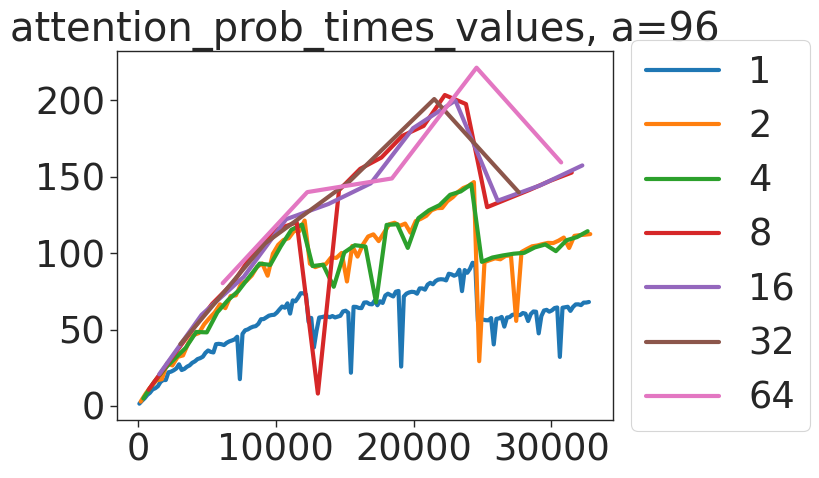

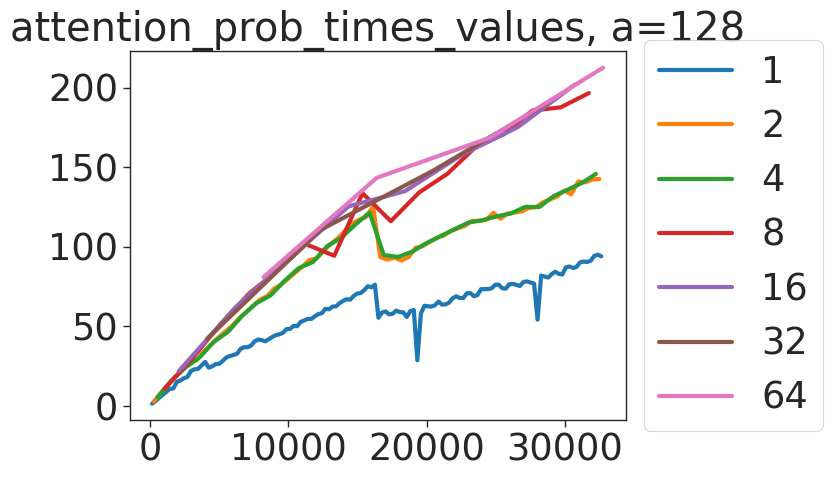

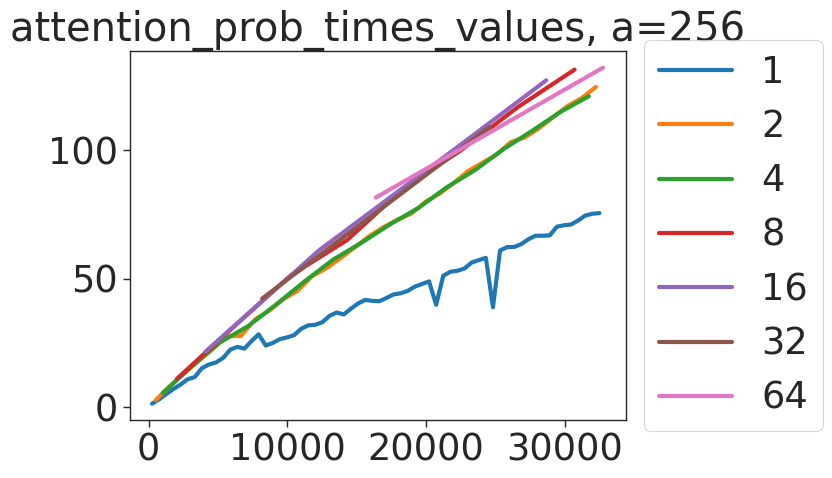

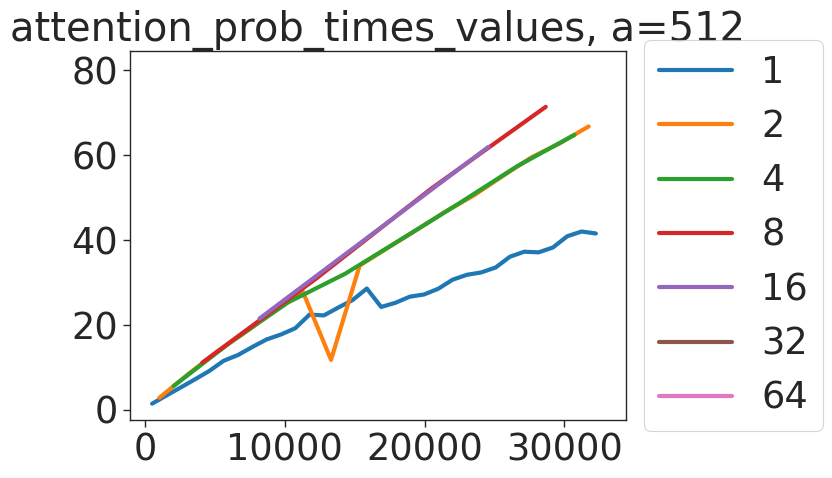

In [7]:
def plot_multiples(values):
    num_heads = [{'num_attention_heads': 8},{'num_attention_heads': 12},{'num_attention_heads': 16},{'num_attention_heads': 20},{'num_attention_heads': 24},{'num_attention_heads': 32},{'num_attention_heads': 40},{'num_attention_heads': 64},{'num_attention_heads': 80},
                 {'num_attention_heads': 96},{'num_attention_heads': 128},{'num_attention_heads': 256},{'num_attention_heads': 512}]
    for i in num_heads:
        a=i["num_attention_heads"]
        df = pd.DataFrame(values)
        df=df[df["num_attention_heads"]==a]
        m1 = df[(df["hidden_size"]/a)%2  != 0]
        m2 = df[((df["hidden_size"]/a)%2  == 0) & ((df["hidden_size"]/a)%4  != 0)]
        m4 = df[((df["hidden_size"]/a)%4  == 0) & ((df["hidden_size"]/a)%8  != 0)]
        m8 = df[((df["hidden_size"]/a)%8  == 0) & ((df["hidden_size"]/a)%16  != 0)]
        m16 = df[((df["hidden_size"]/a)%16  == 0) & ((df["hidden_size"]/a)%32  != 0)]
        m32 = df[((df["hidden_size"]/a)%32  == 0) & ((df["hidden_size"]/a)%64  != 0)]
        m64 = df[((df["hidden_size"]/a)%64  == 0)]
        plt.figure()
        plt.plot(m1["hidden_size"],m1["attention_key_query_prob"],label=1)
        plt.plot(m2["hidden_size"],m2["attention_key_query_prob"], label=2)
        plt.plot(m4["hidden_size"],m4["attention_key_query_prob"], label=4)
        plt.plot(m8["hidden_size"],m8["attention_key_query_prob"], label=8)
        plt.plot(m16["hidden_size"],m16["attention_key_query_prob"], label=16)
        plt.plot(m32["hidden_size"],m32["attention_key_query_prob"], label=32)
        plt.plot(m64["hidden_size"],m64["attention_key_query_prob"], label=64)
        plt.title(f"attention_key_query_prob, a={a}")
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))

    for i in num_heads:
        a=i["num_attention_heads"]
        df = pd.DataFrame(values)
        df=df[df["num_attention_heads"]==a]
        m1 = df[(df["hidden_size"]/a)%2  != 0]
        m2 = df[((df["hidden_size"]/a)%2  == 0) & ((df["hidden_size"]/a)%4  != 0)]
        m4 = df[((df["hidden_size"]/a)%4  == 0) & ((df["hidden_size"]/a)%8  != 0)]
        m8 = df[((df["hidden_size"]/a)%8  == 0) & ((df["hidden_size"]/a)%16  != 0)]
        m16 = df[((df["hidden_size"]/a)%16  == 0) & ((df["hidden_size"]/a)%32  != 0)]
        m32 = df[((df["hidden_size"]/a)%32  == 0) & ((df["hidden_size"]/a)%64  != 0)]
        m64 = df[((df["hidden_size"]/a)%64  == 0)]
        plt.figure()
        plt.plot(m1["hidden_size"],m1["attention_prob_times_values"],label=1)
        plt.plot(m2["hidden_size"],m2["attention_prob_times_values"], label=2)
        plt.plot(m4["hidden_size"],m4["attention_prob_times_values"], label=4)
        plt.plot(m8["hidden_size"],m8["attention_prob_times_values"], label=8)
        plt.plot(m16["hidden_size"],m16["attention_prob_times_values"], label=16)
        plt.plot(m32["hidden_size"],m32["attention_prob_times_values"], label=32)
        plt.plot(m64["hidden_size"],m64["attention_prob_times_values"], label=64)
        plt.title(f"attention_prob_times_values, a={a}")
        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))


plot_multiples(read_logfile("results/3d_plot.out"))

/tmp/ipykernel_2127550/3066578877.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


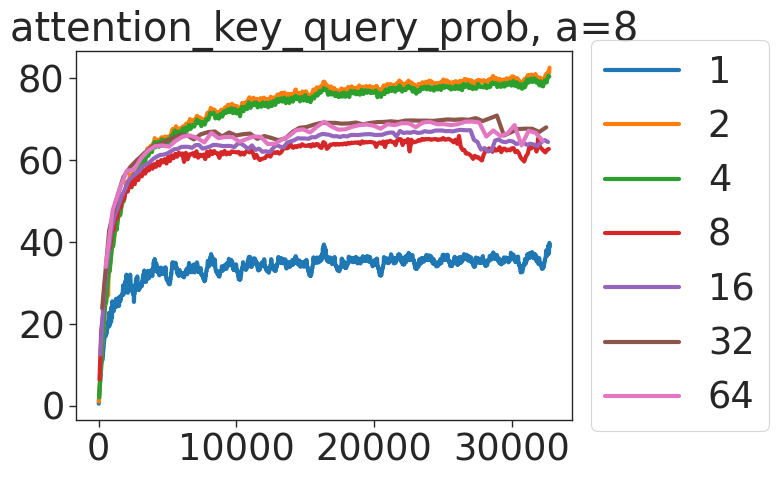

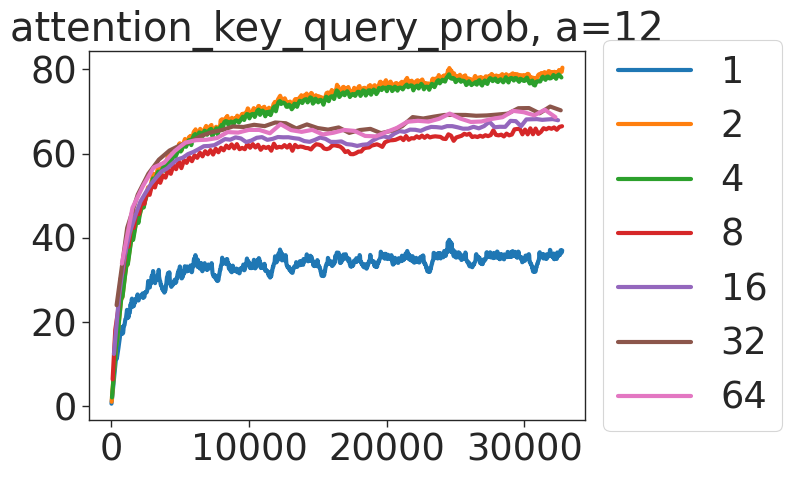

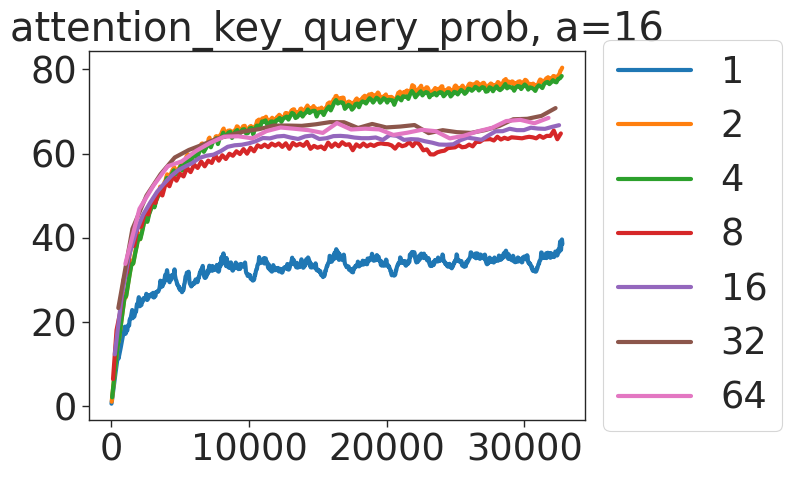

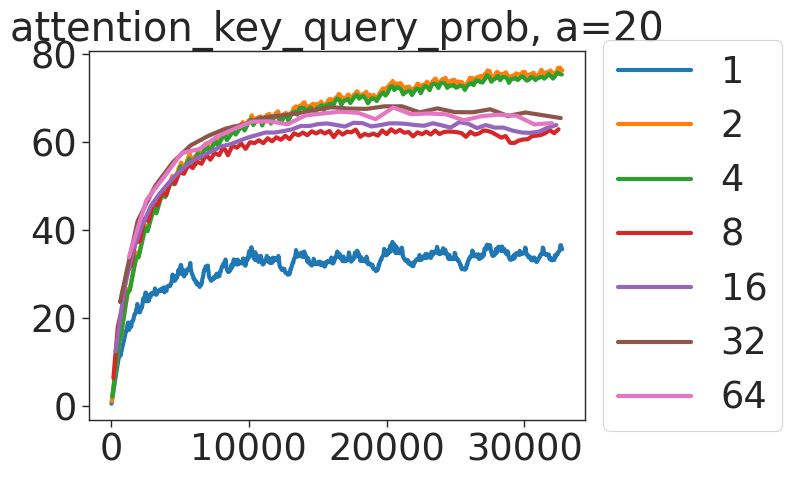

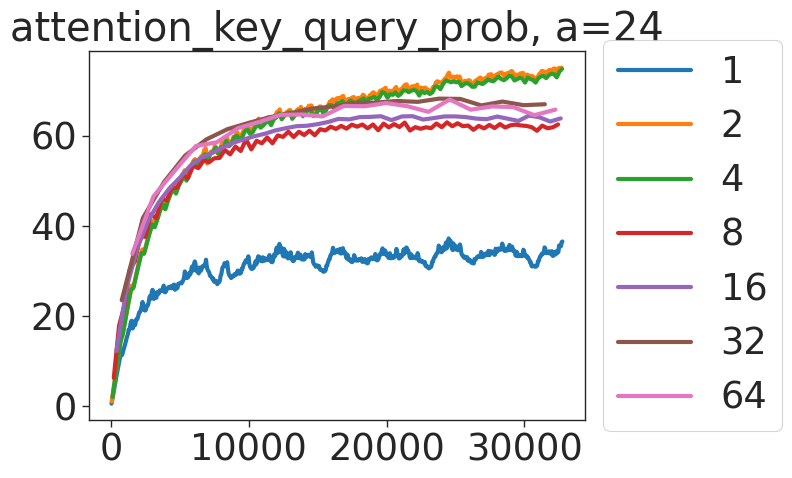

...

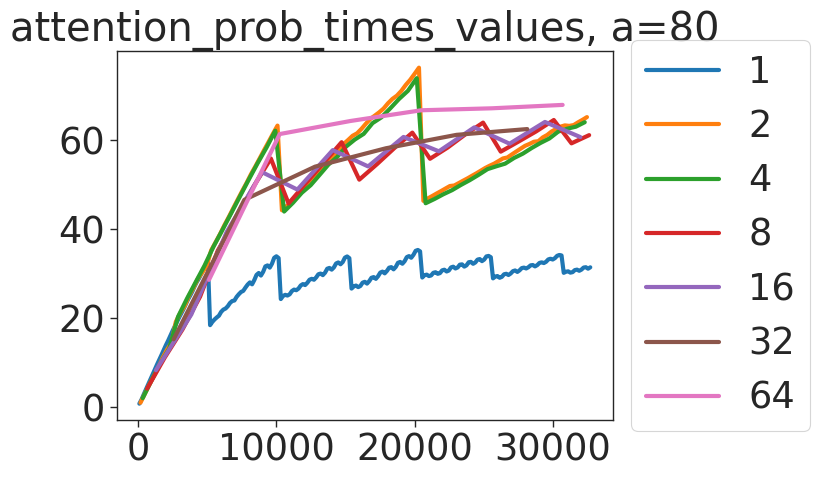

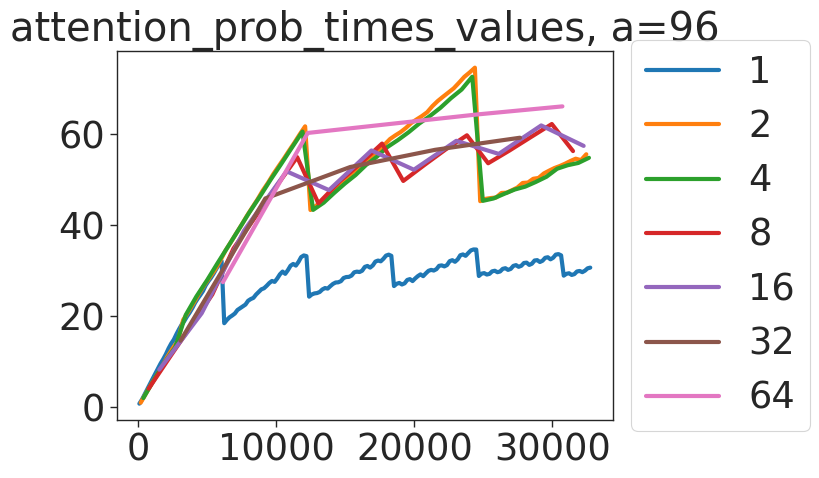

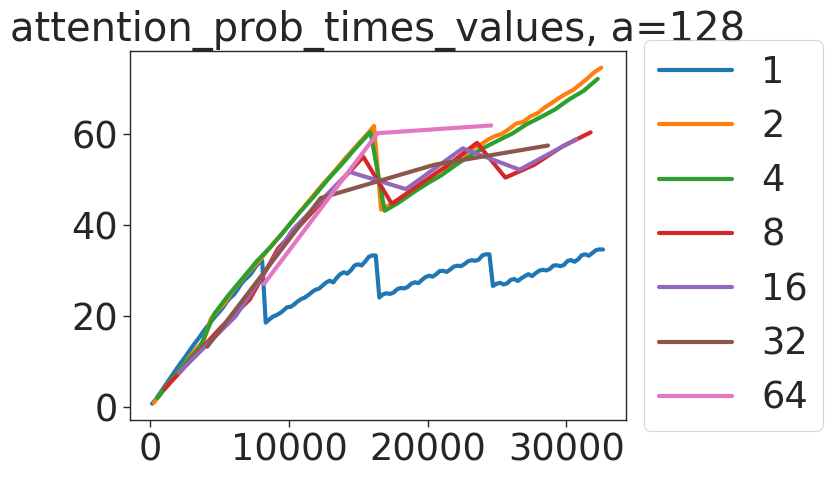

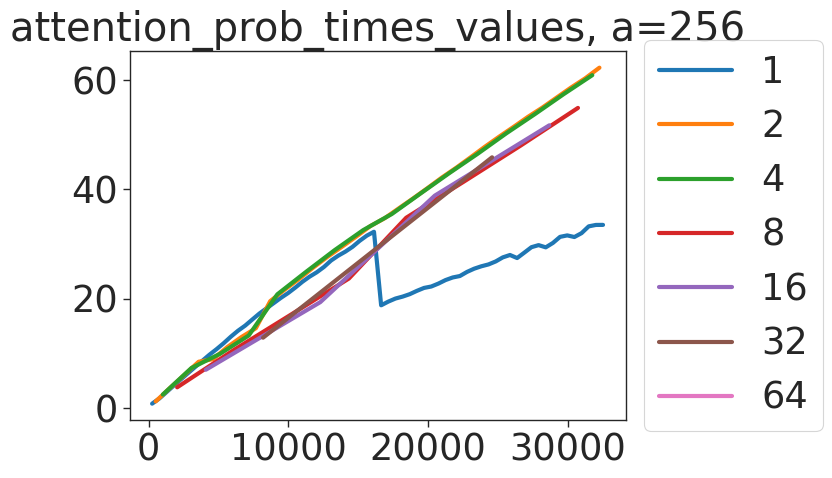

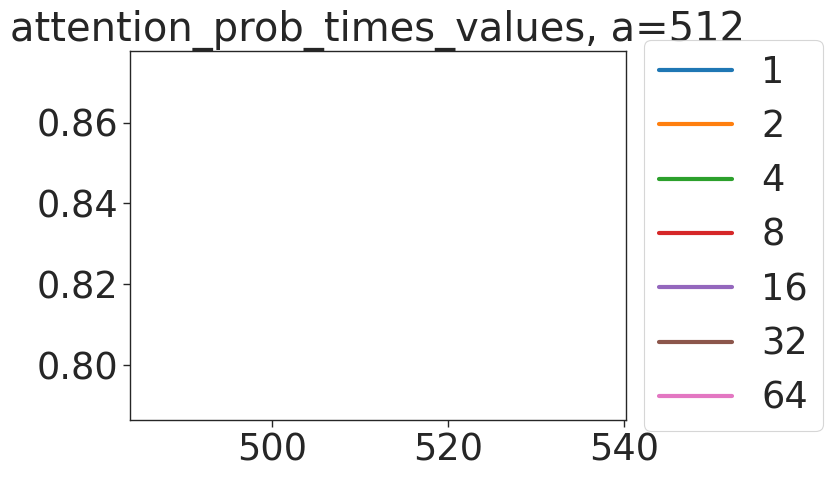

In [8]:
plot_multiples(read_logfile("results/3d_plot_V100.out"))

/tmp/ipykernel_2127550/3066578877.py:37: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


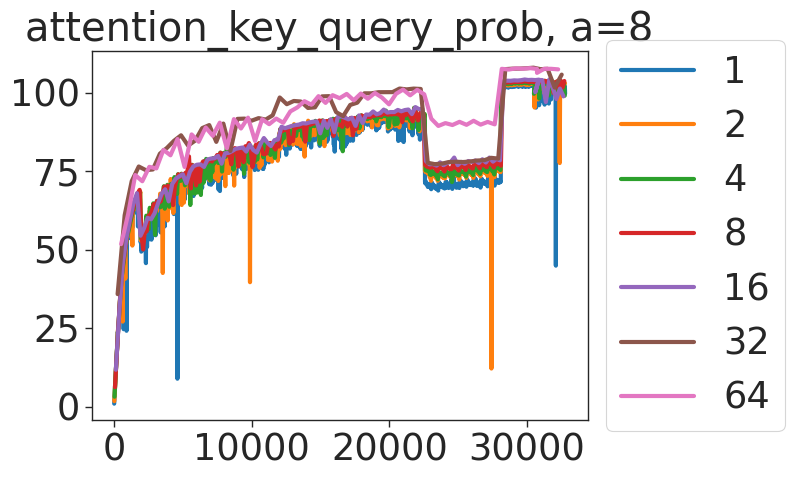

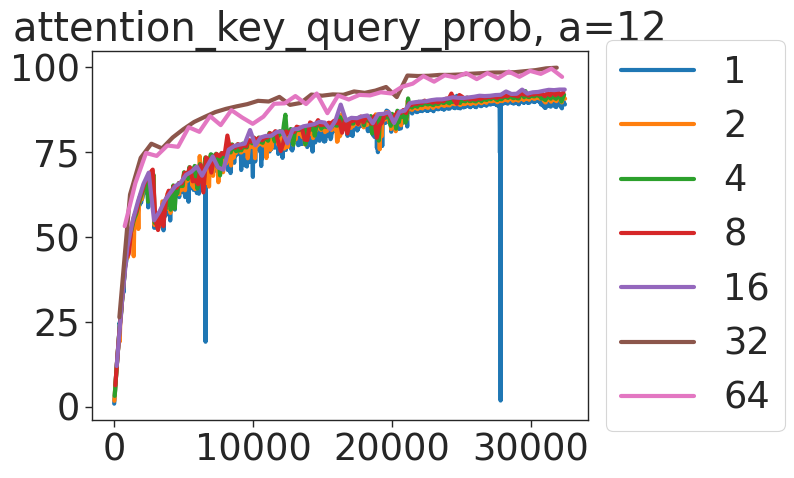

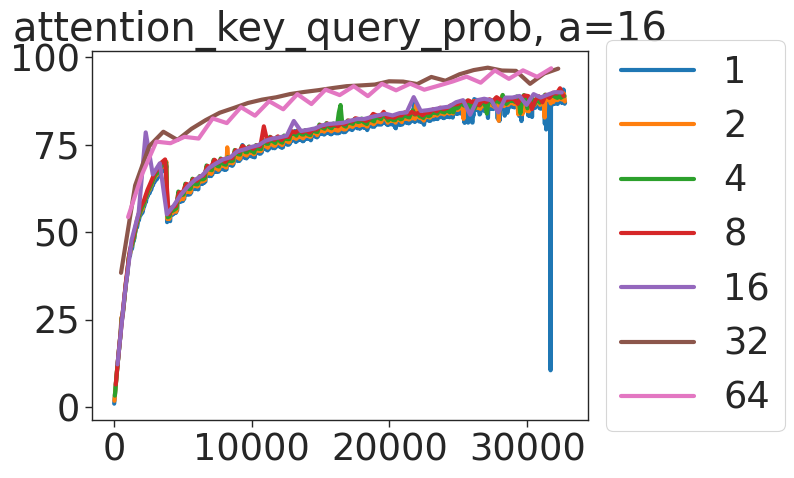

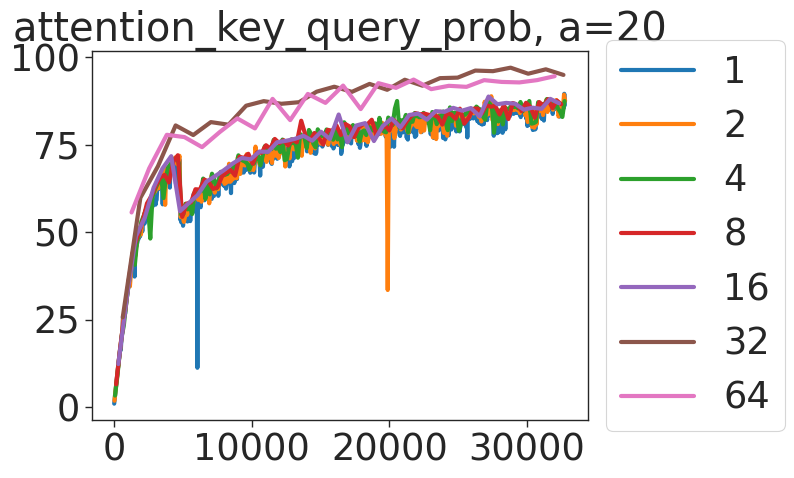

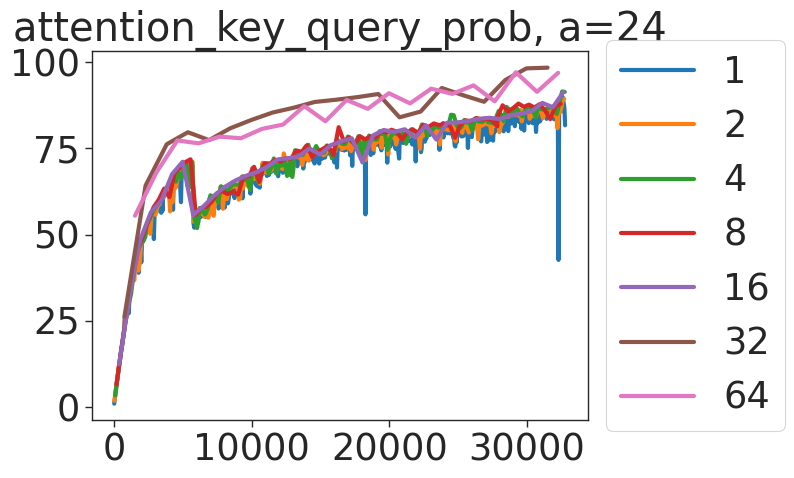

...

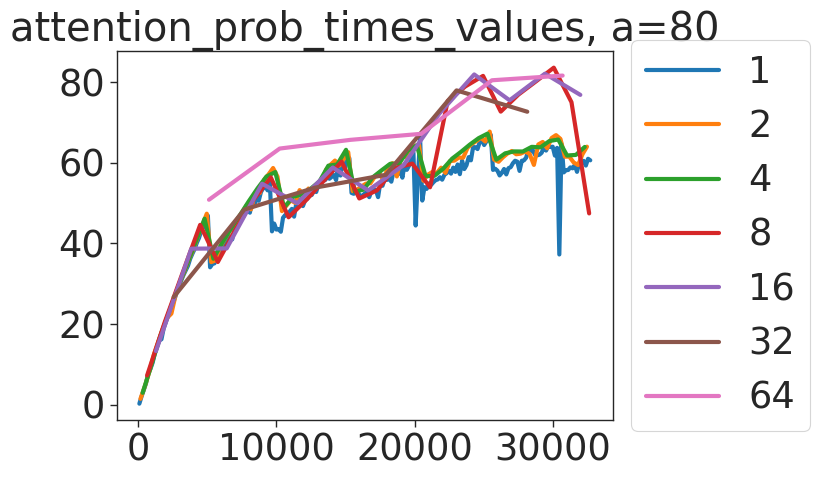

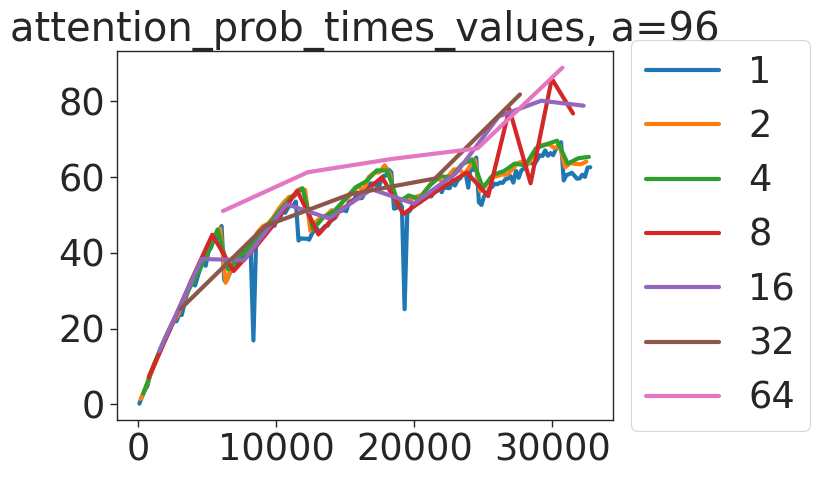

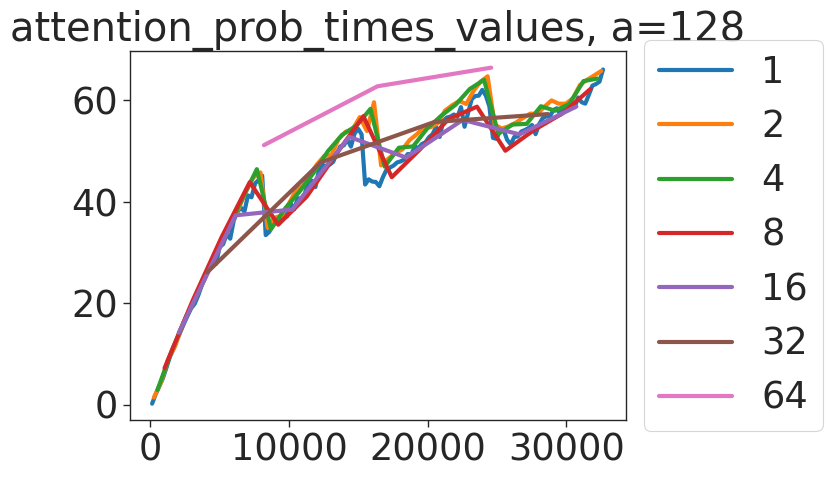

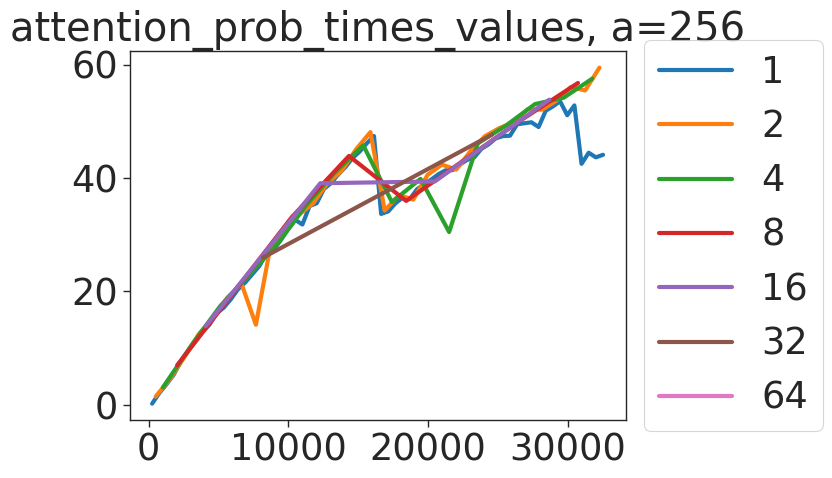

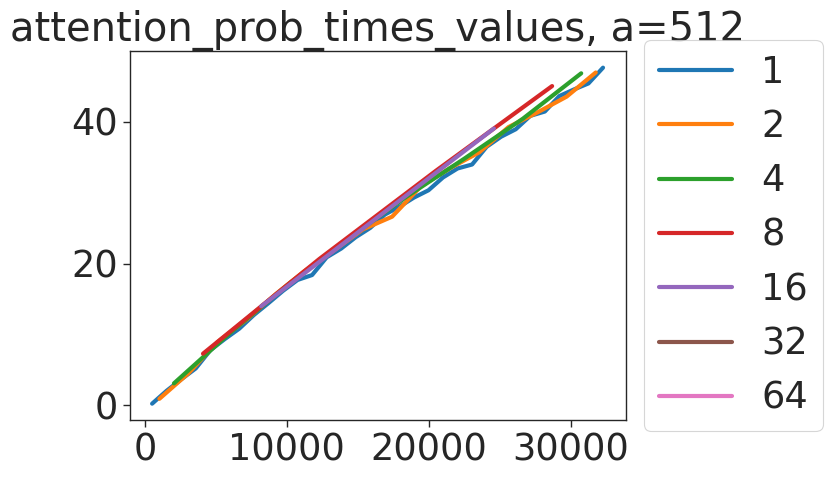

In [10]:
plot_multiples(read_logfile("results/3d_plot_mi250.out"))